In [1]:
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd 
from PIL import Image
%matplotlib inline

In [2]:
LABEL_DIR_NAME = "0.05x_seg_to_0.5x"
SAMPLE_DIR_NAME = "HE_10x_exported_0.5x"
Image.MAX_IMAGE_PIXELS = 1000000000

ref = pd.read_excel("AI_data20200812.xlsx")

In [3]:
"H1503586" in ref["検体番号"].to_list()

True

In [4]:
ref.loc[ref["検体番号"] == "H15113112" , "ER"]

1    99.0
Name: ER, dtype: float64

In [5]:
def label_sample_generator(ref, stain="ER"):
    for l, s in zip(sorted(os.listdir(LABEL_DIR_NAME)), sorted(os.listdir(SAMPLE_DIR_NAME))):
        sample_name =l.split(" - ")[0].strip()
        if sample_name in ref["検体番号"].to_list():
            percent = ref.loc[ref["検体番号"] == sample_name, stain].iloc[0]
            group = 0
            if percent > 90:                
                group = 1
            elif percent == 0:
                group = 0
            else:
                continue
            yield l, s, group

In [6]:
len([i for i in label_sample_generator(ref)])

25

In [7]:
for i in label_sample_generator(ref):
    print(i)

('H1503586 - 2015-04-08 19.46.02_0.05x_seg_to_0.5x.jpg', 'H1503586 - 2015-04-08 19.46.02_0.5x.jpg', 1)
('H15113112 - 2015-09-18 15.36.37_0.05x_seg_to_0.5x.jpg', 'H15113112 - 2015-09-18 15.36.37_0.5x.jpg', 1)
('H15125442 - 2015-10-23 03.51.11_0.05x_seg_to_0.5x.jpg', 'H15125442 - 2015-10-23 03.51.11_0.5x.jpg', 1)
('H1515720 - 2015-12-24 16.03.39_0.05x_seg_to_0.5x.jpg', 'H1515720 - 2015-12-24 16.03.39_0.5x.jpg', 0)
('H1614497 - 2016-11-21 16.52.00_0.05x_seg_to_0.5x.jpg', 'H1614497 - 2016-11-21 16.52.00_0.5x.jpg', 1)
('H17058021 - 2017-05-26 03.21.38_0.05x_seg_to_0.5x.jpg', 'H17058021 - 2017-05-26 03.21.38_0.5x.jpg', 0)
('H1707042 - 2017-06-29 13.32.38_0.05x_seg_to_0.5x.jpg', 'H1707042 - 2017-06-29 13.32.38_0.5x.jpg', 0)
('H17123612 - 2017-10-10 22.59.59_0.05x_seg_to_0.5x.jpg', 'H17123612 - 2017-10-10 22.59.59_0.5x.jpg', 1)
('H1714440 - 2017-11-21 23.18.50_0.05x_seg_to_0.5x.jpg', 'H1714440 - 2017-11-21 23.18.50_0.5x.jpg', 0)
('H18006713 - 2018-06-26 16.21.39_0.05x_seg_to_0.5x.jpg', 'H18006

In [8]:
gen = label_sample_generator(ref)


In [9]:

gen = label_sample_generator(ref)
# for l, f in gen:
#     l_im = Image.open(os.path.join(LABEL_DIR_NAME, l))
#     f_im = Image.open(os.path.join(SAMPLE_DIR_NAME, f))
#     #画像をarrayに変換
#     l_im_list = np.asarray(l_im)
#     f_im_list = np.asarray(f_im)
#     #貼り付け
#     print(l)
#     plt.imshow(l_im_list)
#     plt.show()
#     print(f)
#     plt.imshow(f_im_list)
#     plt.show()
l, f, g = next(gen)
l_im = Image.open(os.path.join(LABEL_DIR_NAME, l))
f_im = Image.open(os.path.join(SAMPLE_DIR_NAME, f))
#画像をarrayに変換
l_im_list = np.asarray(l_im)
f_im_list = np.asarray(f_im)
#貼り付け
print(l)
# plt.imshow(l_im_list)
# plt.show()
print(f)
# plt.imshow(f_im_list)
# plt.show()

H1503586 - 2015-04-08 19.46.02_0.05x_seg_to_0.5x.jpg
H1503586 - 2015-04-08 19.46.02_0.5x.jpg



224×224 pixel ごとに分割

In [10]:
l_im_list.shape[0] // 224

71

In [11]:
def split_img(img, px=224):
    """Split Image Object to specified px"""
    w_list = [(px * i,  px * (i+1)) for i in range(img.shape[0] // px)]
    h_list = [(px * i,  px * (i+1)) for i in range(img.shape[1] // px)]
    print(f"Dimention : {len(w_list)}, {len(h_list)}")
    return [img[w_s:w_e, h_s:h_e, :] for w_s, w_e in w_list for h_s, h_e in h_list]
    

In [12]:
l_sub_im_list = split_img(l_im_list)
s_sub_im_list = split_img(f_im_list)
assert all([image.shape == (224, 224, 3) for image in s_sub_im_list])

Dimention : 71, 128
Dimention : 71, 128


R == 225 のインデックスを取得

In [13]:
cv2.split(l_sub_im_list[4179])

[array([[  0,   0,   0, ...,   6,   6,   6],
        [  0,   0,   0, ...,   6,   6,   6],
        [  0,   0,   0, ...,   5,   6,   6],
        ...,
        [  5,   5,   7, ..., 254, 254, 254],
        [  3,   5,   5, ..., 254, 254, 254],
        [  3,   3,   5, ..., 254, 254, 254]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [6, 6, 7, ..., 0, 0, 0],
        [6, 6, 6, ..., 0, 0, 0],
        [7, 6, 6, ..., 0, 0, 0]], dtype=uint8)]

In [20]:
bool(0)

False

In [14]:
def get_stained_segment_ids(sub_im_list, threshold=200, percent=90, px=224):
    ids = []
    for id_, sub_im in enumerate(sub_im_list):
        r, g, b = cv2.split(sub_im)
        if np.count_nonzero(r > threshold) > px ** 2 * percent / 100:
            ids.append(id_)
    return ids
target_ids = get_stained_segment_ids(l_sub_im_list)
target_ids

[4307,
 4308,
 4433,
 4434,
 4435,
 4436,
 4562,
 4563,
 4564,
 4690,
 4691,
 4692,
 4819,
 4820,
 4947,
 4948,
 4949,
 4950,
 5078,
 5079,
 5207,
 5208,
 5209,
 5210,
 5335,
 5336,
 5337,
 5338,
 5339,
 6119,
 6120,
 6248,
 6249,
 6376,
 6377,
 6378,
 6505,
 6506,
 6507,
 6626,
 6628,
 6633,
 6634,
 6635,
 6636,
 6755,
 6756,
 6757,
 6758,
 6759,
 6760,
 6763,
 6764,
 6883,
 6884,
 6885,
 6886,
 6887,
 7013,
 7014,
 7015,
 7140,
 7267,
 7394,
 7395,
 7522]

In [15]:
len(s_sub_im_list)

9088

In [16]:
def get_stained_im_list(sub_im_list, ids, verbose=False):
    target_im_list = []
    
    for id_ in ids:
        sub_im = sub_im_list[id_]
        target_im_list.append(sub_im)
        if verbose:
            print(f"id: {id_}")
            plt.imshow(sub_im)
            plt.show()
    return target_im_list

id: 4307


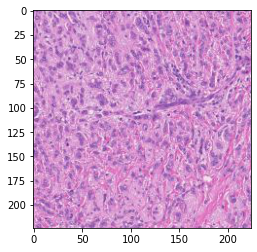

id: 4308


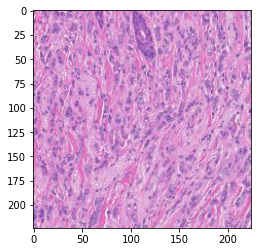

id: 4433


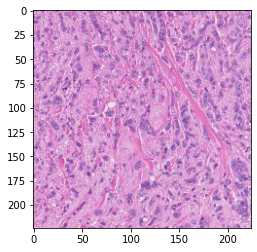

id: 4434


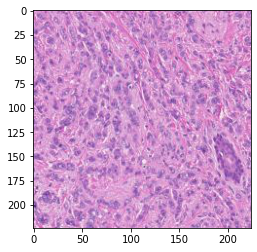

id: 4435


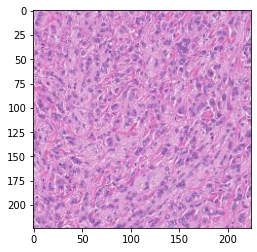

id: 4436


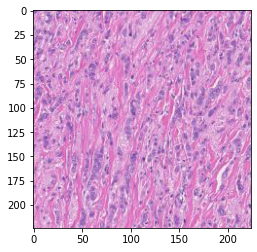

id: 4562


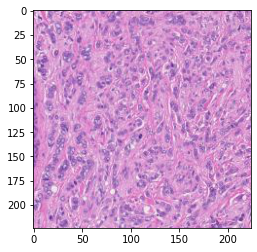

id: 4563


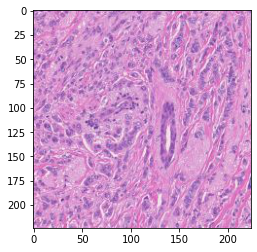

id: 4564


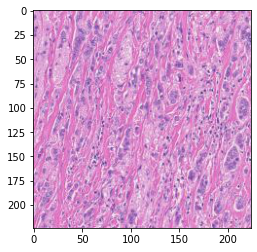

id: 4690


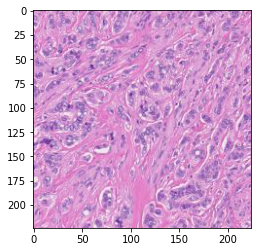

id: 4691


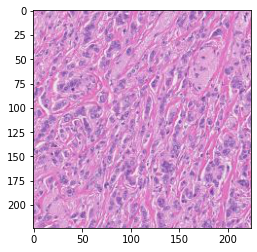

id: 4692


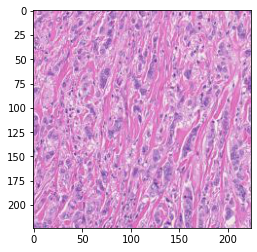

id: 4819


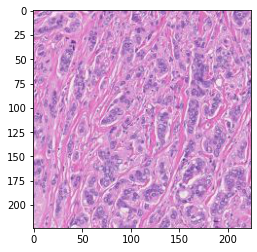

id: 4820


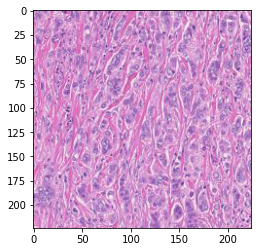

id: 4947


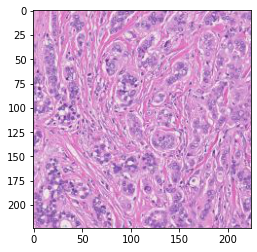

id: 4948


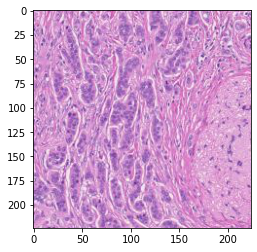

id: 4949


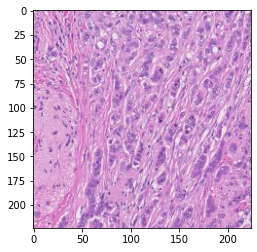

id: 4950


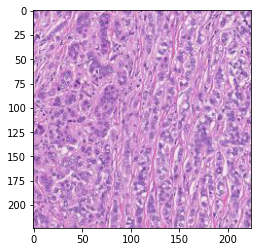

id: 5078


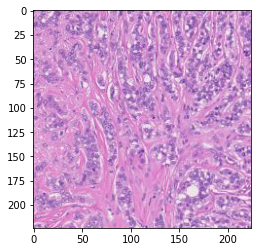

id: 5079


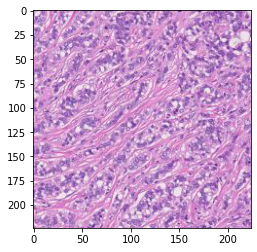

id: 5207


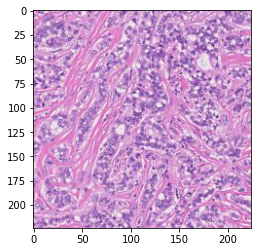

id: 5208


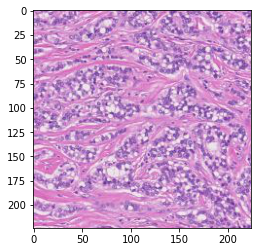

id: 5209


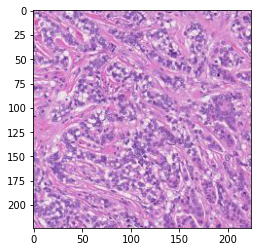

id: 5210


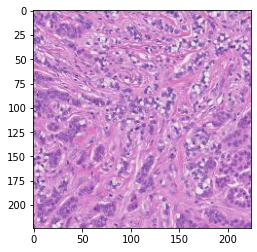

id: 5335


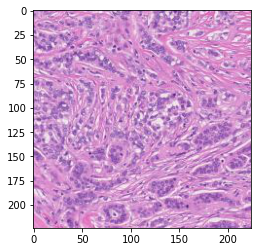

id: 5336


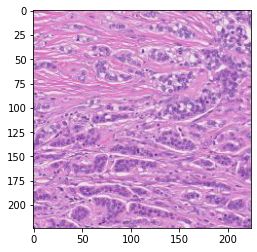

id: 5337


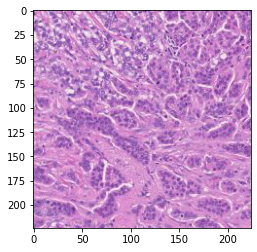

id: 5338


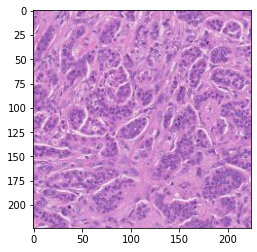

id: 5339


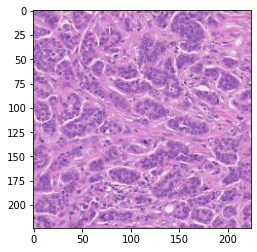

id: 6119


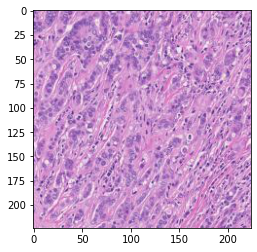

id: 6120


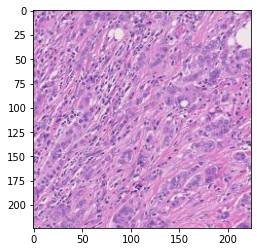

id: 6248


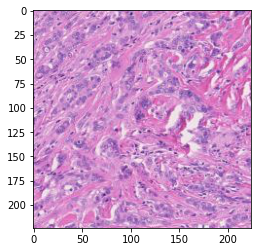

id: 6249


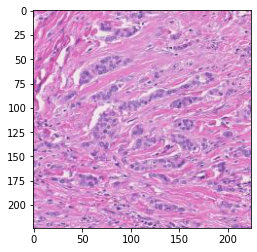

id: 6376


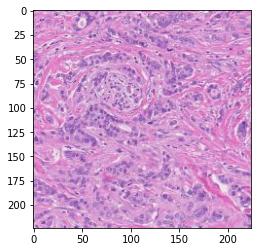

id: 6377


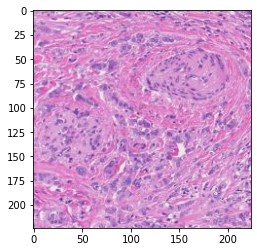

id: 6378


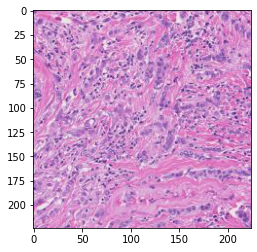

id: 6505


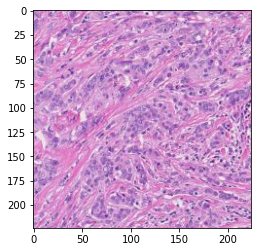

id: 6506


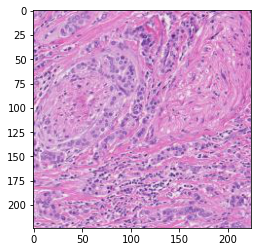

id: 6507


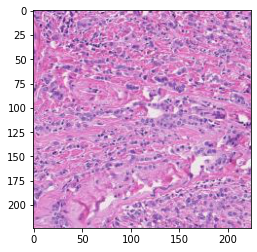

id: 6626


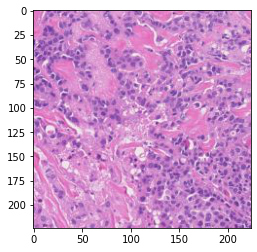

id: 6628


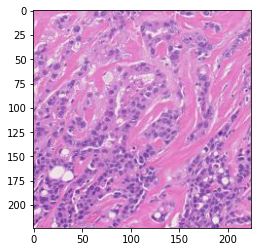

id: 6633


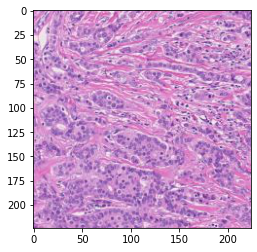

id: 6634


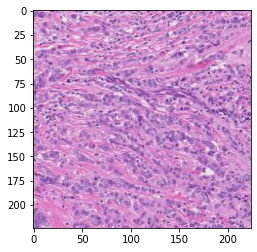

id: 6635


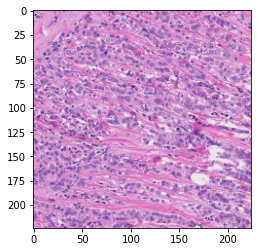

id: 6636


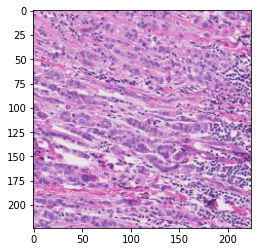

id: 6755


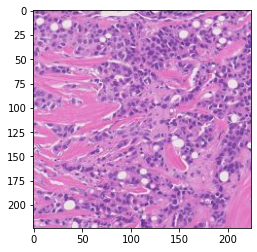

id: 6756


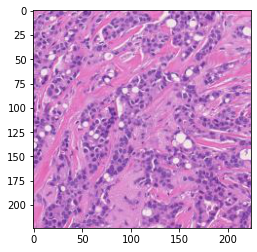

id: 6757


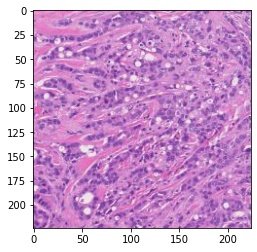

id: 6758


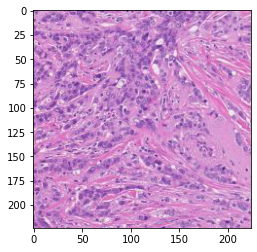

id: 6759


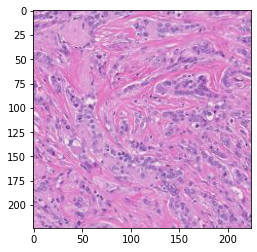

id: 6760


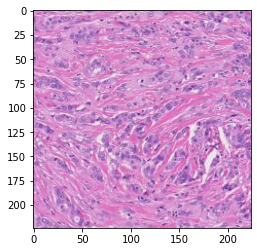

id: 6763


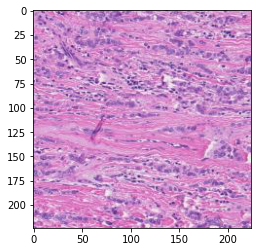

id: 6764


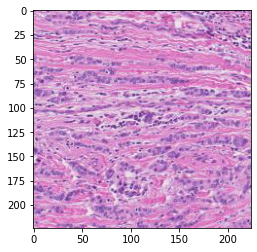

id: 6883


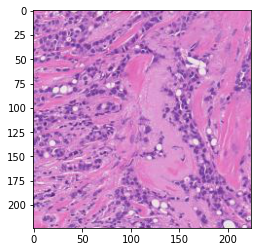

id: 6884


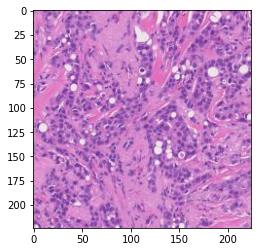

id: 6885


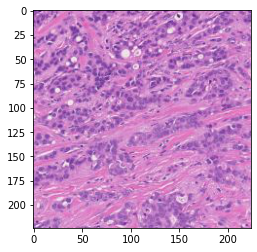

id: 6886


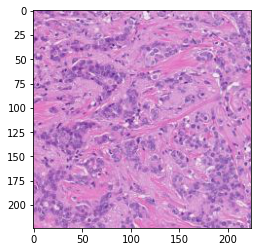

id: 6887


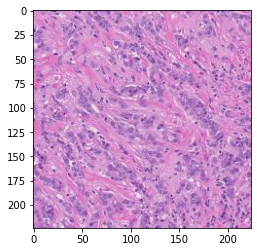

id: 7013


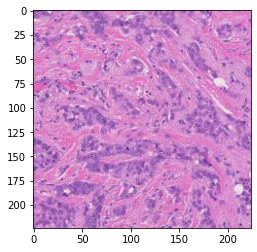

id: 7014


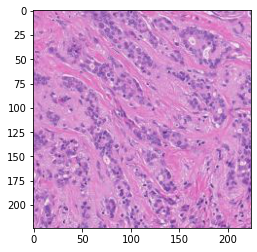

id: 7015


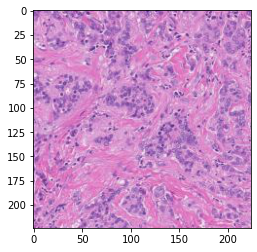

id: 7140


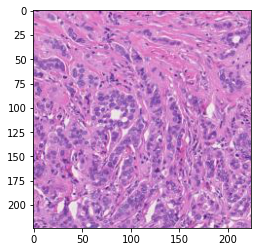

id: 7267


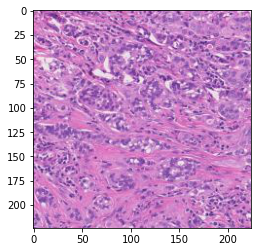

id: 7394


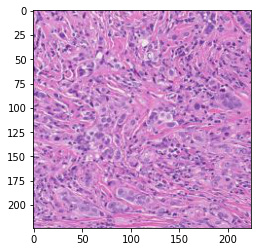

id: 7395


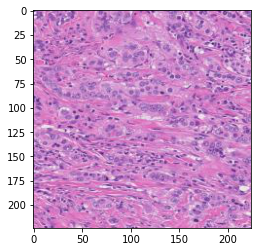

id: 7522


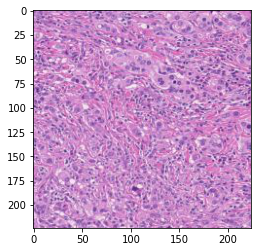

In [17]:
target_im_list = get_stained_im_list(s_sub_im_list, target_ids, verbose=True)

ラベル読み込み

In [18]:
pd.read_excel("AI_data20200812.xlsx")

,検体番号,ER,PgR,HER2(IHC),Ki-67
0,H1503586,96.0,96.0,3,30
1,H15113112,99.0,3.0,0,25
2,H15125442,100.0,50.0,1,40
3,H1515720,0.0,0.0,2,60
4,H1603413,80.0,80.0,1,40
5,H16076452,80.0,0.9,2,-
6,H1608115,40.0,0.0,2,15
7,H1614497,95.0,0.9,1,35
8,H1614561,20.0,0.9,0,30
9,H1704438,80.0,80.0,1,35


ER

In [25]:
im_dict = {"case": {}, "control": {}}

In [26]:
im_dict

{'case': {}, 'control': {}}